# Mushsrooms genus cnn_modeling
## Objective
Objective is to explore different models with diferent parameters to find suitible solution for images data of most common Northern European mushrooms genus.

In [1]:
from fastai.vision.all import *
from pathlib import Path
import shutil
from shutil import copy2
import os
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import timm
from fastai.vision.widgets import ImageClassifierCleaner

In [2]:
path = Path('/kaggle/working/')
pathv = Path('/kaggle/working/train_data')
patht = Path('/kaggle/working/train_data')

In [3]:
data_dir = '/kaggle/input/mushrooms-genus-cleaned1/Mushrooms'

In [4]:
image_counts= {}
for category in os.listdir(data_dir):
    category_path =os.path.join(data_dir,category)
    if os.path.isdir(category_path):
        image_counts[category] = len(os.listdir(category_path))
        
for category, count in image_counts.items():
    print(f"{category}: {count} images")

Entoloma: 330 images
Suillus: 288 images
Hygrocybe: 303 images
Agaricus: 344 images
Amanita: 717 images
Lactarius: 1410 images
Russula: 992 images
Boletus: 1043 images
Cortinarius: 780 images


In [5]:
data_paths = []
labels = []

for subdir, _, files in os.walk(data_dir):
    for file in files:
        if file.endswith((".jpg", ".jpeg", ".png")):
            path = os.path.join(subdir, file)
            label = os.path.basename(subdir)
            data_paths.append(path)
            labels.append(label)

train_paths, val_paths, train_labels, test_val_labels = train_test_split(data_paths, labels, test_size=0.15, stratify=labels, random_state=42)

for paths, folder in [(train_paths, "train_data"), (val_paths, "val_data")]:
    for path in paths:
        label = os.path.basename(os.path.dirname(path))
        dest_path = os.path.join(folder, label, os.path.basename(path))
        os.makedirs(os.path.dirname(dest_path), exist_ok=True)
        copy2(path, dest_path)

In [6]:
folders = ['train_data', 'val_data']
data_dir = './'  # Assuming the folders are in the same directory as this script

for folder in folders:
    folder_path = os.path.join(data_dir, folder)
    image_counts = {}
    for category in os.listdir(folder_path):
        category_path = os.path.join(folder_path, category)
        if os.path.isdir(category_path):
            image_counts[category] = len(os.listdir(category_path))

    print(f"Folder: {folder}")
    for category, count in image_counts.items():
        print(f"{category}: {count} images")
    print()

Folder: train_data
Suillus: 245 images
Boletus: 886 images
Amanita: 609 images
Agaricus: 292 images
Russula: 843 images
Hygrocybe: 258 images
Lactarius: 1198 images
Cortinarius: 663 images
Entoloma: 281 images

Folder: val_data
Suillus: 43 images
Boletus: 157 images
Amanita: 108 images
Agaricus: 52 images
Russula: 149 images
Hygrocybe: 45 images
Lactarius: 212 images
Cortinarius: 117 images
Entoloma: 49 images



In [7]:
failed = verify_images(get_image_files(patht))
failed.map(Path.unlink)
len(failed)

0

In [8]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

0

In [9]:
failed = verify_images(get_image_files(pathv))
failed.map(Path.unlink)
len(failed)

0

In [10]:
Mushrooms_strat=  DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,  
    splitter=GrandparentSplitter(train_name = "train_data", valid_name = "val_data"),  
    get_y=parent_label,  
    
    item_tfms=RandomResizedCrop(224, min_scale=0.2),
    
)

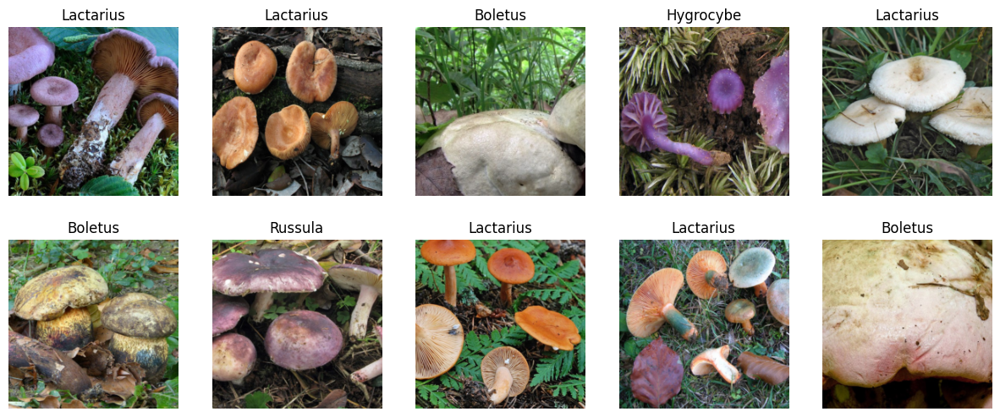

In [11]:
dls = Mushrooms_strat.dataloaders(source=data_dir, path=data_dir)
dls.show_batch(max_n=10, nrows=2)

In [12]:
Resnet18_strat = vision_learner(dls, resnet18, metrics=error_rate).to_fp16()

Resnet18_strat.fine_tune(5)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 139MB/s] 


epoch,train_loss,valid_loss,error_rate,time
0,1.894216,0.935869,0.306867,00:22


epoch,train_loss,valid_loss,error_rate,time
0,1.164403,0.706932,0.230687,00:20
1,0.897376,0.476329,0.177039,00:21
2,0.626811,0.422267,0.152361,00:21
3,0.470142,0.385442,0.133047,00:20
4,0.376485,0.378586,0.134120,00:21


In [13]:
interp= ClassificationInterpretation.from_learner(Resnet18_strat)

In [14]:
interp.print_classification_report()

              precision    recall  f1-score   support

    Agaricus       0.77      0.77      0.77        52
     Amanita       0.95      0.81      0.88       108
     Boletus       0.96      0.96      0.96       157
 Cortinarius       0.77      0.75      0.76       117
    Entoloma       0.82      0.84      0.83        49
   Hygrocybe       0.93      0.91      0.92        45
   Lactarius       0.86      0.92      0.89       212
     Russula       0.87      0.89      0.88       149
     Suillus       0.73      0.70      0.71        43

    accuracy                           0.87       932
   macro avg       0.85      0.84      0.84       932
weighted avg       0.87      0.87      0.87       932



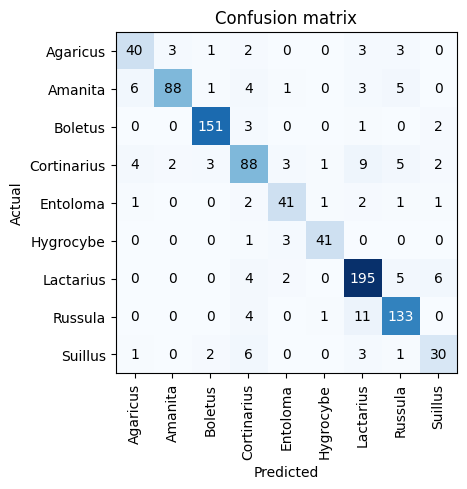

In [15]:
interp.plot_confusion_matrix()

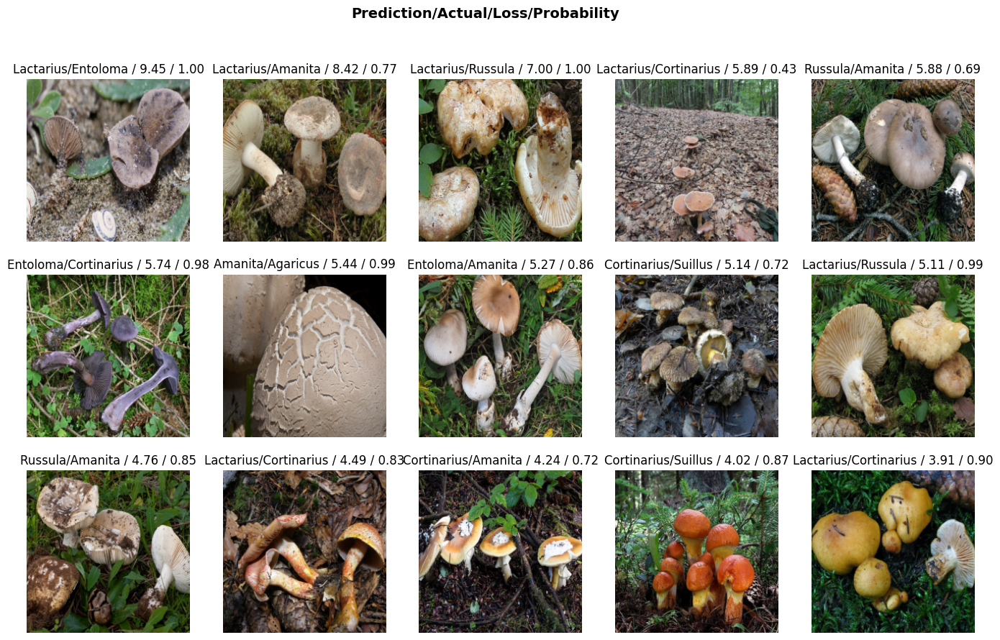

In [16]:
interp.plot_top_losses(15,figsize=(17,10))

In [17]:
convnext_tiny_in22k = vision_learner(dls, 'convnext_tiny_in22k', metrics=error_rate).to_fp16()

convnext_tiny_in22k.fine_tune(10)

/opt/conda/lib/python3.10/site-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name convnext_tiny_in22k to current convnext_tiny.fb_in22k.
  model = create_fn(


model.safetensors:   0%|          | 0.00/178M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.003642,0.296060,0.094421,00:24


epoch,train_loss,valid_loss,error_rate,time
0,0.405877,0.222927,0.074034,00:31
1,0.365121,0.174935,0.060086,00:31
2,0.304250,0.169959,0.061159,00:31
3,0.254729,0.158061,0.055794,00:31
4,0.206591,0.138208,0.045064,00:31
5,0.176672,0.128082,0.037554,00:31
6,0.149626,0.123459,0.036481,00:31
7,0.138870,0.120103,0.037554,00:31
8,0.134379,0.110144,0.034335,00:31
9,0.125164,0.108058,0.033262,00:31


SuggestedLRs(minimum=8.31763736641733e-07, steep=6.309573450380412e-07, valley=2.75422871709452e-06, slide=5.248074739938602e-05)

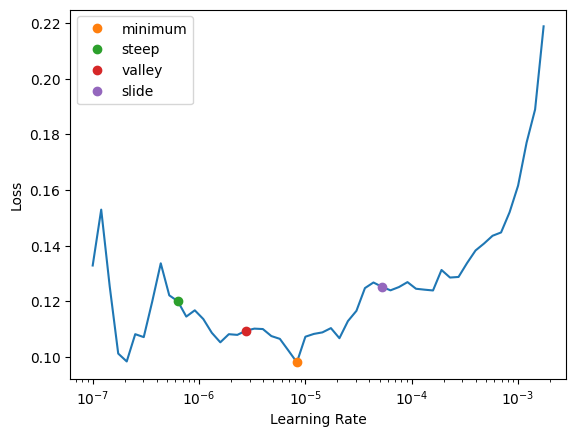

In [18]:
convnext_tiny_in22k.lr_find(suggest_funcs=(minimum,steep,valley,slide))

In [19]:
interp2= ClassificationInterpretation.from_learner(convnext_tiny_in22k)

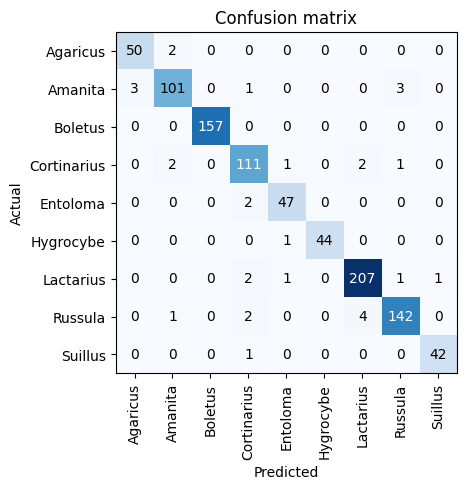

In [20]:
interp2.plot_confusion_matrix()

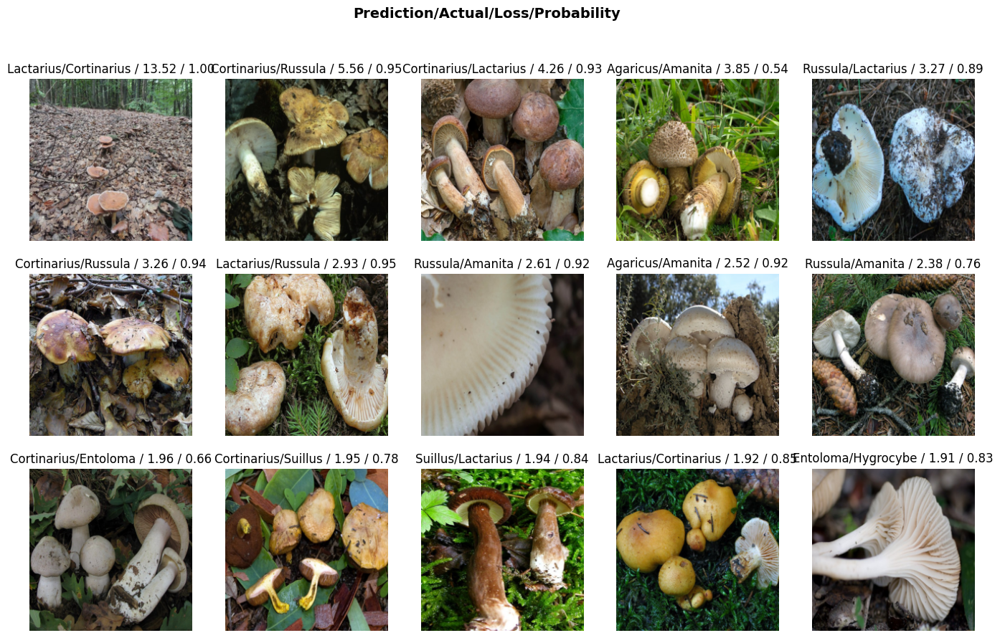

In [21]:
interp2.plot_top_losses(15,figsize=(17,10))

In [22]:
convnext_tiny_in22k_ll = vision_learner(dls, 'convnext_tiny_in22k', metrics=error_rate,lr=0.00001).to_fp16()

convnext_tiny_in22k_ll.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,0.964586,0.287212,0.104077,00:26


epoch,train_loss,valid_loss,error_rate,time
0,0.407956,0.228299,0.083691,00:32
1,0.337989,0.187343,0.060086,00:32
2,0.314384,0.177679,0.057940,00:32
3,0.264371,0.170420,0.055794,00:31
4,0.214182,0.141271,0.048283,00:31
5,0.186286,0.135187,0.041845,00:31
6,0.156538,0.135902,0.039700,00:31
7,0.126981,0.122559,0.034335,00:31
8,0.116696,0.119186,0.035408,00:31
9,0.122346,0.120652,0.039700,00:31


In [23]:
convnext_tiny_in22k_hl = vision_learner(dls, 'convnext_tiny_in22k', metrics=error_rate,lr=0.1).to_fp16()

convnext_tiny_in22k_hl.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,0.951753,0.288423,0.097639,00:25


epoch,train_loss,valid_loss,error_rate,time
0,0.376285,0.225869,0.085837,00:31
1,0.362761,0.195526,0.072961,00:31
2,0.311649,0.140116,0.048283,00:31
3,0.260727,0.148549,0.052575,00:31
4,0.220361,0.156622,0.054721,00:31
5,0.189247,0.132167,0.049356,00:31
6,0.151475,0.129210,0.041845,00:31
7,0.131321,0.122388,0.046137,00:31
8,0.130827,0.117537,0.038627,00:31
9,0.127779,0.119887,0.042918,00:31


In [24]:
interp_hl= ClassificationInterpretation.from_learner(convnext_tiny_in22k_hl)

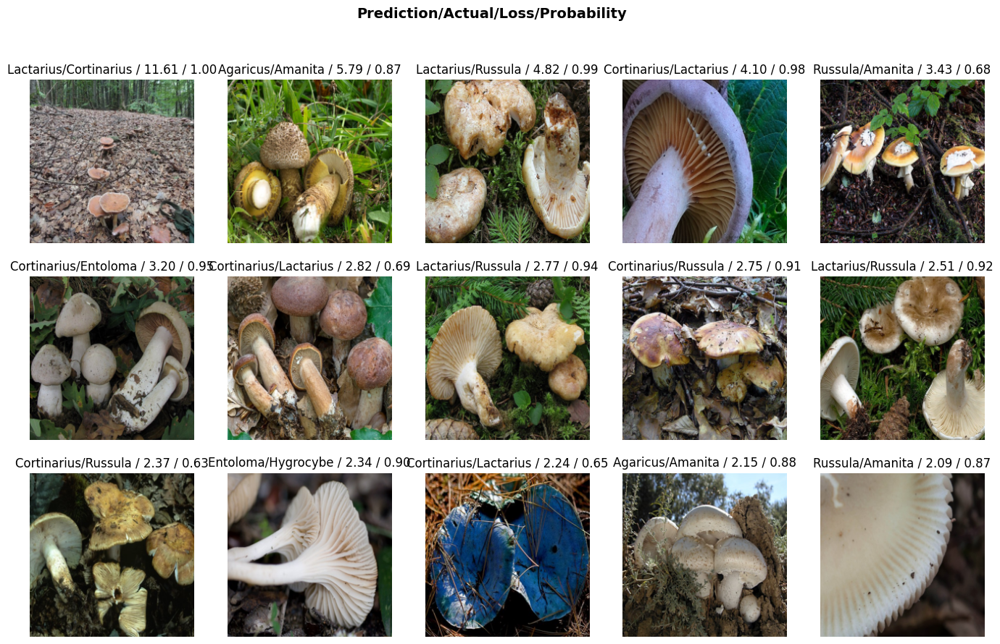

In [25]:
interp_hl.plot_top_losses(15,figsize=(17,10))

In [26]:
timm.list_models()

['bat_resnext26ts',
 'beit_base_patch16_224',
 'beit_base_patch16_384',
 'beit_large_patch16_224',
 'beit_large_patch16_384',
 'beit_large_patch16_512',
 'beitv2_base_patch16_224',
 'beitv2_large_patch16_224',
 'botnet26t_256',
 'botnet50ts_256',
 'caformer_b36',
 'caformer_m36',
 'caformer_s18',
 'caformer_s36',
 'cait_m36_384',
 'cait_m48_448',
 'cait_s24_224',
 'cait_s24_384',
 'cait_s36_384',
 'cait_xs24_384',
 'cait_xxs24_224',
 'cait_xxs24_384',
 'cait_xxs36_224',
 'cait_xxs36_384',
 'coat_lite_medium',
 'coat_lite_medium_384',
 'coat_lite_mini',
 'coat_lite_small',
 'coat_lite_tiny',
 'coat_mini',
 'coat_small',
 'coat_tiny',
 'coatnet_0_224',
 'coatnet_0_rw_224',
 'coatnet_1_224',
 'coatnet_1_rw_224',
 'coatnet_2_224',
 'coatnet_2_rw_224',
 'coatnet_3_224',
 'coatnet_3_rw_224',
 'coatnet_4_224',
 'coatnet_5_224',
 'coatnet_bn_0_rw_224',
 'coatnet_nano_cc_224',
 'coatnet_nano_rw_224',
 'coatnet_pico_rw_224',
 'coatnet_rmlp_0_rw_224',
 'coatnet_rmlp_1_rw2_224',
 'coatnet_rmlp_1_r

In [27]:
convnext_base = vision_learner(dls, 'convnext_base.clip_laion2b_augreg_ft_in12k_in1k_384', metrics=error_rate).to_fp16()

convnext_base.fine_tune(12)

model.safetensors:   0%|          | 0.00/354M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.105121,0.341321,0.108369,00:48


epoch,train_loss,valid_loss,error_rate,time
0,0.426712,0.224831,0.068670,01:05
1,0.321623,0.220208,0.079399,01:06
2,0.274025,0.200270,0.062232,01:06
3,0.217052,0.171069,0.050429,01:05
4,0.175970,0.146874,0.041845,01:05
5,0.137414,0.144133,0.040773,01:06
6,0.124868,0.115115,0.030043,01:04
7,0.077352,0.086877,0.026824,01:04
8,0.068906,0.076733,0.023605,01:04
9,0.049954,0.083607,0.027897,01:04


SuggestedLRs(minimum=4.78630090583465e-07, steep=6.309573450380412e-07, valley=1.3182567499825382e-06, slide=5.754399353463668e-06)

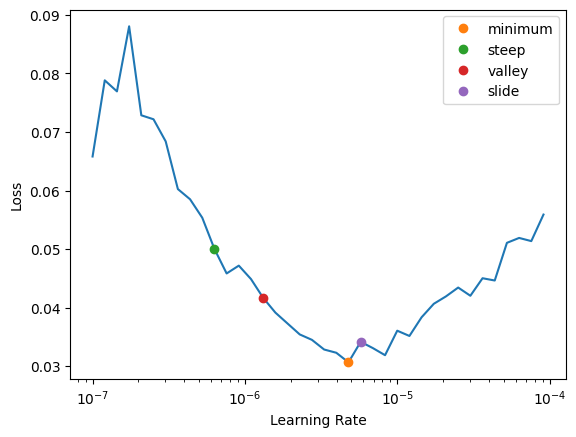

In [29]:
convnext_base.lr_find(suggest_funcs=(minimum,steep,valley,slide))

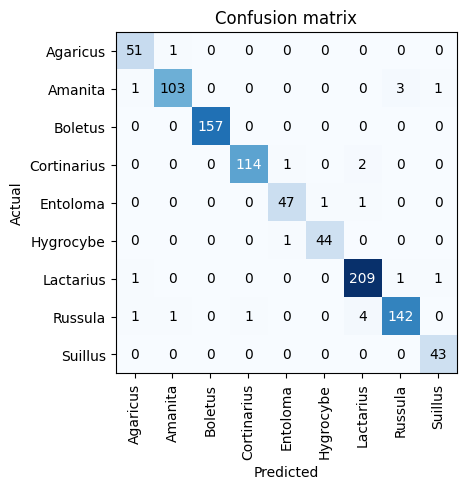

In [30]:
interp_b= ClassificationInterpretation.from_learner(convnext_base)
interp_b.plot_confusion_matrix()


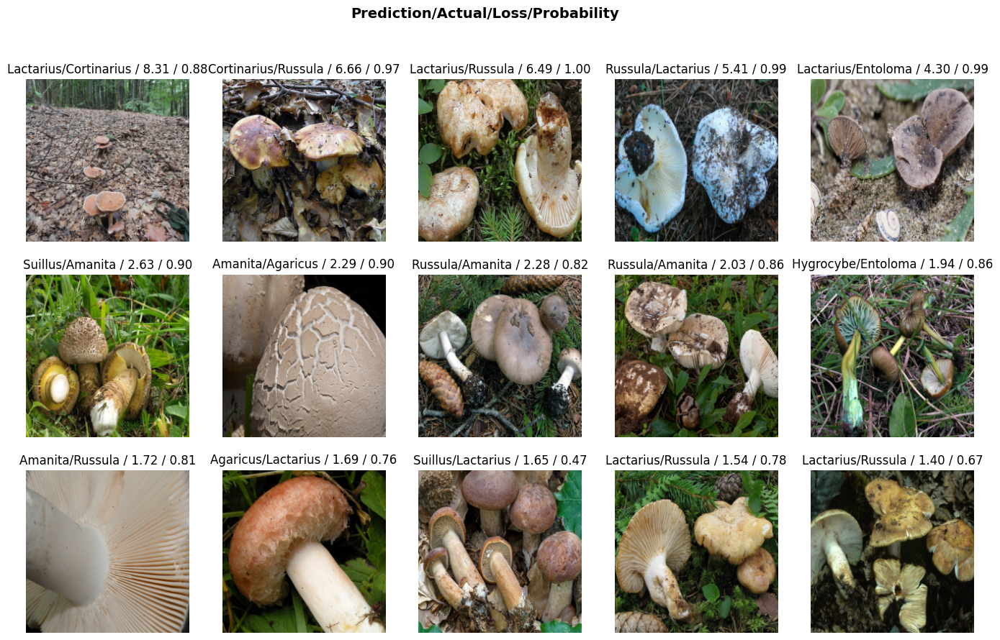

In [31]:
interp_b.plot_top_losses(15,figsize=(17,10))

In [32]:
convnext_base1 = vision_learner(dls, 'convnext_base.clip_laion2b_augreg_ft_in12k_in1k_384', metrics=error_rate,lr=0.1).to_fp16()

convnext_base1.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,1.034521,0.381687,0.125536,00:50


epoch,train_loss,valid_loss,error_rate,time
0,0.443150,0.228330,0.072961,01:05
1,0.346284,0.191767,0.070815,01:06
2,0.280157,0.154930,0.051502,01:06
3,0.208122,0.161453,0.049356,01:06
4,0.158657,0.130413,0.040773,01:06
5,0.109126,0.114634,0.035408,01:06
6,0.078851,0.088335,0.025751,01:05
7,0.071440,0.102482,0.030043,01:04
8,0.053093,0.094653,0.030043,01:04
9,0.054376,0.089492,0.023605,01:04


In [33]:
convnext_base2 = vision_learner(dls, 'convnext_base.clip_laion2b_augreg_ft_in12k_in1k_384', metrics=error_rate,lr=0.00001).to_fp16()

convnext_base2.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,1.050268,0.388491,0.134120,00:48


epoch,train_loss,valid_loss,error_rate,time
0,0.455756,0.220454,0.070815,01:05
1,0.346491,0.181803,0.060086,01:06
2,0.265319,0.195451,0.061159,01:06
3,0.216987,0.153397,0.052575,01:05
4,0.146371,0.154279,0.043991,01:05
5,0.118000,0.134392,0.036481,01:05
6,0.089919,0.104044,0.026824,01:05
7,0.067183,0.104003,0.027897,01:06
8,0.055720,0.097810,0.030043,01:05
9,0.049591,0.094633,0.027897,01:06


Best model found is  convnext_base.clip_laion2b_augreg_ft_in12k_in1k_384 with learning rate of 0.1, it has  error rate of 0.023605 ,that's 2.3%

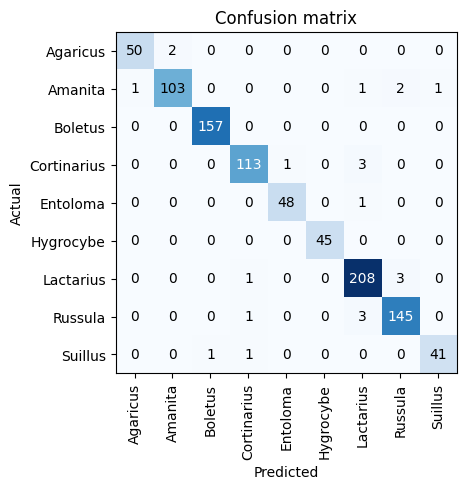

In [34]:
interp_cb= ClassificationInterpretation.from_learner(convnext_base1)
interp_cb.plot_confusion_matrix()

In [38]:
interp_cb.print_classification_report()

              precision    recall  f1-score   support

    Agaricus       0.98      0.96      0.97        52
     Amanita       0.98      0.95      0.97       108
     Boletus       0.99      1.00      1.00       157
 Cortinarius       0.97      0.97      0.97       117
    Entoloma       0.98      0.98      0.98        49
   Hygrocybe       1.00      1.00      1.00        45
   Lactarius       0.96      0.98      0.97       212
     Russula       0.97      0.97      0.97       149
     Suillus       0.98      0.95      0.96        43

    accuracy                           0.98       932
   macro avg       0.98      0.97      0.98       932
weighted avg       0.98      0.98      0.98       932



In [40]:
interp_cb.most_confused()

[('Cortinarius', 'Lactarius', 3),
 ('Lactarius', 'Russula', 3),
 ('Russula', 'Lactarius', 3),
 ('Agaricus', 'Amanita', 2),
 ('Amanita', 'Russula', 2),
 ('Amanita', 'Agaricus', 1),
 ('Amanita', 'Lactarius', 1),
 ('Amanita', 'Suillus', 1),
 ('Cortinarius', 'Entoloma', 1),
 ('Entoloma', 'Lactarius', 1),
 ('Lactarius', 'Cortinarius', 1),
 ('Russula', 'Cortinarius', 1),
 ('Suillus', 'Boletus', 1),
 ('Suillus', 'Cortinarius', 1)]

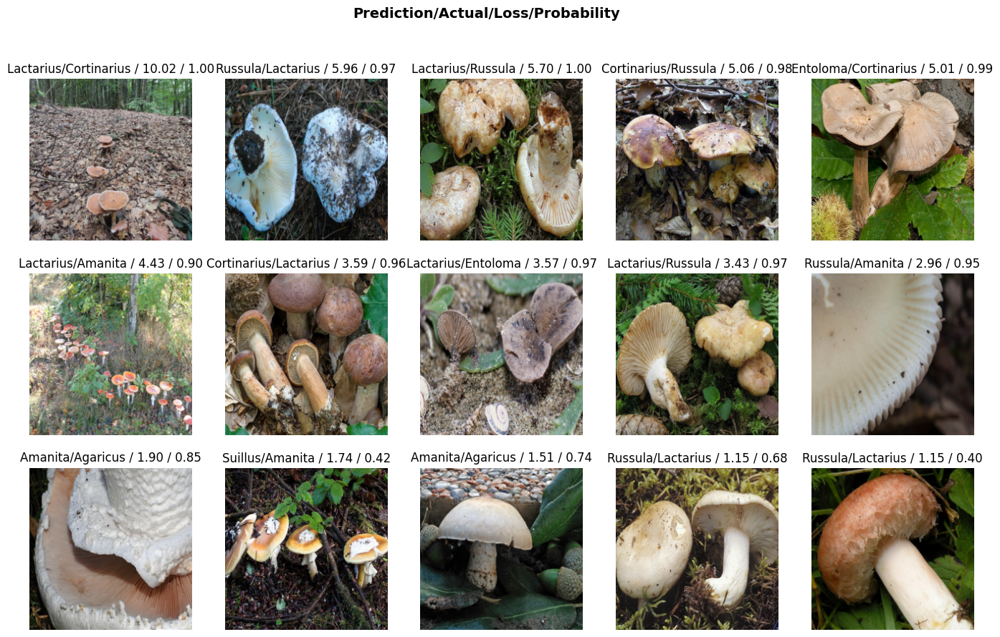

In [35]:
interp_cb.plot_top_losses(15,figsize=(17,10))

In [45]:
convnext_base1.summary()

Sequential (Input shape: 64 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     64 x 128 x 56 x 56  
Conv2d                                    6272       True      
LayerNorm2d                               256        True      
Identity                                                       
Conv2d                                    6400       True      
LayerNorm                                 256        True      
____________________________________________________________________________
                     64 x 56 x 56 x 512  
Linear                                    66048      True      
GELU                                                           
Dropout                                                        
Identity                                                       
____________________________________________________________________________
                     64 x 56 x 56 x 128  
Linear                             

In [41]:
convnext_base1.export()

# Overview
* After modeling we have found:
* best performing model: convnext_base.clip_laion2b_augreg_ft_in12k_in1k_384 
* error rate of 0.026 
* Macro avg  precision 0.98 and recall 0.97 
## What could be improved
* More datacould be gathered
* Dataset could be balanced
* Could be gathered only images that has biger size,in a way that resize coud be made to a biger frame